<a href="https://colab.research.google.com/github/mariagontijo/emap-rir-/blob/master/2019sri_mariagontijo_parte2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# EMAP - Projeto Final Sistema de Recuperação de Informação -
#### Maria Gabriela G Gontijo

Para o Projeto Final foram selecionados dois tipos de documentos: 


i) relatórios feitos por dirigentes do Banco Central no período de 2001 a 2019;

ii)contratos entre concessiónaria e poder concedente do setor de energia no Brasil, os quais foram assinados no período de 1997 a 2019;  

#### Imports... 

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
from IPython.display import clear_output
from pdfminer.converter import TextConverter
from pdfminer.layout import LAParams
from pdfminer.pdfinterp import PDFResourceManager
from pdfminer.pdfinterp import PDFPageInterpreter
from pdfminer.pdfpage import PDFPage
from textblob import TextBlob
import io
import math
import string
import nltk 
from wordcloud import WordCloud
import os
import PyPDF2
from math import log
from sklearn.feature_extraction.text import TfidfVectorizer
import spacy
import matplotlib.pyplot as plt
import pt_core_news_sm


In [0]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import re
import whoosh
import nltk
import string
import shutil
import gensim
import logging
#------------------------------------------------------------------------------------
from IPython.display import display, Markdown, Latex
from collections import defaultdict,Counter,OrderedDict
from math import log
from sklearn.feature_extraction.text import TfidfVectorizer
from numpy.linalg import norm
from string import punctuation
#____________________________________________________________________________________
from gensim import corpora, models, similarities
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel,wrappers,FastText
#____________________________________________________________________________________
from nltk.corpus import machado, mac_morpho,stopwords
from nltk.tokenize import WordPunctTokenizer
from nltk.stem.snowball import SnowballStemmer
#____________________________________________________________________________________
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline
#____________________________________________________________________________________
from whoosh import sorting
from whoosh.index import create_in, open_dir
from whoosh.fields import *
from whoosh import qparser
from whoosh.qparser import QueryParser

#### Função para leitura dos documentos tipo pdf 

In [0]:
#Leitura dos documentos com a biblioteca pdfminer

def read_pdf(path):
    rsrcmgr = PDFResourceManager()
    retstr = io.StringIO()
    codec = 'utf-8'
    laparams = LAParams()
    device = TextConverter(rsrcmgr, retstr, codec=codec, laparams=laparams)
    fp = open(path, 'rb')
    interpreter = PDFPageInterpreter(rsrcmgr, device)
    password = ""
    maxpages = 0
    caching = True
    pagenos=set()
    for page in PDFPage.get_pages(fp, pagenos, maxpages=maxpages, password=password, caching=caching, check_extractable=True): 
        interpreter.process_page(page)
    text = retstr.getvalue()
    text = " ".join(text.replace(u"\xa0", " ").strip().split())  
    fp.close()
    device.close()
    retstr.close()
    return text

Construindo a lista de documentos 

In [0]:
#Corpus em português:
nltk.download('stopwords')
swu = stopwords.words('portuguese')+ list(string.punctuation)
stopwords.words('portuguese')
stemmer = SnowballStemmer('portuguese')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\maria.gontijo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [0]:
corpus = pd.read_csv("documentos2.csv")
corpus.head()

,Unnamed: 0,id,content
0,0,001-2002.pdf,CONTRATO DE CONCESSÃO DE TRANSMISSÃO Nº 001/20...
1,1,001-2005.pdf,LOTE A PROCESSO No 48500.001318/04-73 CONTRATO...
2,2,001-2011.pdf,CONTRATO DE CONCESSÃO N° 001/2011-ANEEL TRANSM...
3,3,001-2014.pdf,CONTRATO DE C0NcEssA0 N 2 01/2014-ANEEL MATA D...
4,4,001-2017.pdf,€*ANEELAcíucia Naciohal de Enercia EitmcnPROCE...


## Modelagem de Assuntos

#### 1. Usando a biblioteca Gensim, treine um modelo LSI e LDA para o seu corpus propondo uma metodologia para otimizaçao do numero de assuntos

#### Modelo LDA

In [0]:
import warnings
warnings.simplefilter("ignore", DeprecationWarning)
# Load the LDA model from sk-learn
from sklearn.decomposition import LatentDirichletAllocation as LDA
 
# Helper function
def print_topics(model, count_vectorizer, n_top_words):
    words = count_vectorizer.get_feature_names()
    for topic_idx, topic in enumerate(model.components_):
        print("\nTopic #%d:" % topic_idx)
        print(" ".join([words[i]
                        for i in topic.argsort()[:-n_top_words - 1:-1]]))
        
# Tweak the two parameters below
number_topics = 5
number_words = 10
# Create and fit the LDA model
lda = LDA(n_components=number_topics, n_jobs=-1)
lda.fit(count_data)
# Print the topics found by the LDA model
print("Topics found via LDA:")
print_topics(lda, count_vectorizer, number_words)


Topics found via LDA:

Topic #0:
transmissão aneel contrato transmissora subcláusula serviço instalações concessão público cláusula

Topic #1:
icg chesf verificar 69 geração francisco ii hidro entrada acesse

Topic #2:
transmissão aneel contrato transmissora instalações subcláusula concessão 2018 serviço operação

Topic #3:
transmissão aneel instalações transmissora subcláusula contrato serviço concessão operação anual

Topic #4:
fonte 10 inflação 12 crédito bcb brasil 15 mercado 20


In [0]:
%%time
from pyLDAvis import sklearn as sklearn_lda
import pickle 
import pyLDAvis
LDAvis_data_filepath = os.path.join('./ldavis_prepared_'+str(number_topics))
# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = sklearn_lda.prepare(lda, count_data, count_vectorizer)
    with open(LDAvis_data_filepath, 'w') as f:
            pickle.dump(LDAvis_prepared, f)
        
# load the pre-prepared pyLDAvis data from disk
    with open(LDAvis_data_filepath) as f:
        LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './ldavis_prepared_'+ str(number_topics) +'.html')

Tutorial: https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0

Tutorial:https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/

#### Nota-se que se deve adicionar stopwords ao corpus original após primeiro resultado do modelo LDA

In [0]:
# Remove new line characters
docs2 = [re.sub('\s+', ' ', sent) for sent in corpus.content]

# Remove distracting single quotes
#data = [re.sub("\'", "", sent) for sent in data]

<>:2: DeprecationWarning: invalid escape sequence \s
<>:2: DeprecationWarning: invalid escape sequence \s
<>:2: DeprecationWarning: invalid escape sequence \s
<ipython-input-23-cd6ba6f0f891>:2: DeprecationWarning: invalid escape sequence \s
  docs2 = [re.sub('\s+', ' ', sent) for sent in corpus.content]


In [0]:
def relatorios(discursos):
    
    for fala in discursos:
        yield(gensim.utils.simple_preprocess(str(fala),deacc=True))

In [0]:
dados_p=list(relatorios(docs2))

In [0]:
dados_p

[['contrato',
  'de',
  'concessao',
  'de',
  'transmissao',
  'nº',
  'aneel',
  'goiana',
  'transmissora',
  'de',
  'energia',
  'gtesa',
  'processo',
  'no',
  'contrato',
  'de',
  'concessao',
  'no',
  'aneel',
  'publico',
  'servico',
  'de',
  'de',
  'transmissao',
  'de',
  'energia',
  'eletrica',
  'que',
  'celebram',
  'uniao',
  'goiana',
  'transmissora',
  'de',
  'energia',
  'gtesa',
  'uniao',
  'doravante',
  'designada',
  'apenas',
  'poder',
  'concedente',
  'no',
  'uso',
  'da',
  'competencia',
  'que',
  'lhe',
  'confere',
  'art',
  'inciso',
  'xii',
  'alinea',
  'da',
  'constituicao',
  'federal',
  'por',
  'intermedio',
  'da',
  'agencia',
  'nacional',
  'de',
  'energia',
  'eletrica',
  'aneel',
  'em',
  'conformidade',
  'com',
  'disposto',
  'no',
  'inciso',
  'iv',
  'do',
  'art',
  'da',
  'lei',
  'no',
  'de',
  'de',
  'dezembro',
  'de',
  'autarquia',
  'em',
  'regime',
  'especial',
  'com',
  'sede',
  'na',
  'sgan',
  'qua

In [0]:
bigram=gensim.models.Phrases(dados_p,min_count=20,threshold=50)
trigram=gensim.models.Phrases(bigram[dados_p],threshold=50)
bigram_mod=gensim.models.phrases.Phraser(bigram)
trigram_mod=gensim.models.phrases.Phraser(trigram)

In [0]:
StopWords=set(stopwords.words('portuguese'))


add_stopwords=['gostar','agradeco','seguir','presidente','diretor','partir','tempo',\
               'destacar','nome','lider','iniciar','estar','sao','encerrar','julho',\
               'falar','nao','fazer','aqui','querer','dizer','ja','dar','agora','sim','destaque','art','hoje','estar',\
               'falar','dizer','voces','sra','exa','ainda','dizer','contar','saber','ficar','deixar','passar',\
               'estao','ser','nº','cd','partir','atendimento','considerar','dever','contratar','nº','dever','norma','usar',\
              'conferir','apenas','inscrito','formar','atraves','estar','letra','dar','apenas']

for word in add_stopwords:
    StopWords.add(word)

In [0]:
def remove_stopwords(texto):
    return [[palavra for palavra in simple_preprocess(str(doc)) if palavra not in StopWords] for doc in texto]

def make_bigrams(texto):
    return [bigram_mod[doc] for doc in texto]

def make_trigrams(texto):
    return [trigram_mod[bigram_mod[doc]] for doc in texto]

def lemmatization(texto,tags=['NOUN','ADJ','VERB','ADV']):
    texto_out=[]
    for sent in texto:
        doc=nlp(' '.join(sent))
        texto_out.append([token.lemma_ for token in doc if token.pos_ in tags])
    return texto_out

In [0]:
dados_p_nosw=remove_stopwords(dados_p)
dados_p_bigrams=make_bigrams(dados_p_nosw)
dados_p_trigrams=make_trigrams(dados_p_nosw)
dados_p_bigrams=make_bigrams(dados_p_nosw)
dados_p_trigrams=make_trigrams(dados_p_nosw)

In [0]:
import pt_core_news_sm
nlp = pt_core_news_sm.load()

In [0]:
#nlp=spacy.load("pt_core_news_sm",disable=['parser','ner'])

In [0]:
dados_p_lem=lemmatization(dados_p_bigrams,tags=['NOUN','ADJ','VERB','ADV'])

In [0]:
dados_p_lem_nosw=remove_stopwords(dados_p_lem)
dados_dict=corpora.Dictionary(dados_p_lem_nosw)
textos=dados_p_lem_nosw
corpus2=[dados_dict.doc2bow(text) for text in textos]

In [0]:
logging.disable(logging.CRITICAL)
lda_model=gensim.models.ldamodel.LdaModel(corpus=corpus2,id2word=dados_dict,num_topics=11,random_state=100,update_every=1,
                                         chunksize=100,passes=10,alpha='auto',per_word_topics=True)
print(lda_model.print_topics)
doc_lda=lda_model[corpus2]

<bound method BaseTopicModel.print_topics of <gensim.models.ldamodel.LdaModel object at 0x0000000054848F98>>


In [0]:
print(lda_model.print_topics())
doc_lda = lda_model[corpus2]

[(0, '0.012*"rit" + 0.007*"ﬁnancial" + 0.006*"over" + 0.005*"trade" + 0.004*"life_expectancy" + 0.004*"ar" + 0.004*"post" + 0.004*"dijt" + 0.004*"risk" + 0.004*"notar"'), (1, '0.012*"inflacao" + 0.011*"financeiro" + 0.011*"creditar" + 0.009*"publicar" + 0.007*"expectativa" + 0.007*"juro" + 0.007*"mercar" + 0.006*"setor" + 0.006*"ano" + 0.006*"sistema"'), (2, '0.000*"aneel" + 0.000*"transmissor" + 0.000*"servico" + 0.000*"anual" + 0.000*"datar" + 0.000*"permitir" + 0.000*"publicar" + 0.000*"operacao" + 0.000*"prazo" + 0.000*"bem"'), (3, '0.029*"aneel" + 0.025*"transmissor" + 0.022*"servico" + 0.014*"publicar" + 0.012*"transmissao" + 0.012*"anual" + 0.010*"bem" + 0.010*"permitir" + 0.010*"receitar" + 0.010*"prestacao"'), (4, '0.000*"aneel" + 0.000*"transmissor" + 0.000*"servico" + 0.000*"transmissao" + 0.000*"datar" + 0.000*"publicar" + 0.000*"anual" + 0.000*"operacao" + 0.000*"subclausula" + 0.000*"bem"'), (5, '0.000*"transmissor" + 0.000*"aneel" + 0.000*"servico" + 0.000*"publicar" + 0

In [0]:
coherence_model_lda=CoherenceModel(model=lda_model,texts=dados_p_lem_nosw,dictionary=dados_dict,coherence='c_v')
coherence_lda=coherence_model_lda.get_coherence()
print('\nCoherence Score: ',coherence_lda)



Coherence Score:  0.44886482018538165


In [0]:
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus2))  # a measure of how good the model is. lower the better.


Perplexity:  -6.756202616016531


In [0]:
# Create Dictionary
id2word = dados_dict

# Create Corpus
texts = dados_p_lem_nosw

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 4), (6, 2), (7, 2), (8, 10), (9, 2), (10, 6), (11, 1), (12, 2), (13, 2), (14, 1), (15, 1), (16, 3), (17, 1), (18, 3), (19, 1), (20, 2), (21, 1), (22, 1), (23, 1), (24, 1), (25, 4), (26, 2), (27, 2), (28, 1), (29, 1), (30, 1), (31, 2), (32, 1), (33, 2), (34, 1), (35, 3), (36, 2), (37, 1), (38, 86), (39, 7), (40, 10), (41, 2), (42, 1), (43, 1), (44, 2), (45, 11), (46, 34), (47, 6), (48, 1), (49, 3), (50, 6), (51, 1), (52, 9), (53, 2), (54, 1), (55, 1), (56, 15), (57, 2), (58, 4), (59, 1), (60, 1), (61, 1), (62, 2), (63, 1), (64, 2), (65, 6), (66, 2), (67, 1), (68, 1), (69, 6), (70, 4), (71, 1), (72, 6), (73, 3), (74, 1), (75, 3), (76, 1), (77, 1), (78, 1), (79, 2), (80, 1), (81, 1), (82, 1), (83, 1), (84, 1), (85, 4), (86, 1), (87, 3), (88, 1), (89, 2), (90, 4), (91, 1), (92, 1), (93, 1), (94, 1), (95, 12), (96, 1), (97, 33), (98, 1), (99, 2), (100, 2), (101, 1), (102, 3), (103, 1), (104, 6), (105, 4), (106, 9), (107, 10), (108, 1), (109, 1),

In [0]:
# Human readable format of corpus (term-frequency)
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('abril', 1),
  ('acao', 1),
  ('acao_judicial', 1),
  ('acarretar', 1),
  ('aceito', 1),
  ('acesso', 4),
  ('acoes', 2),
  ('acompanhar', 2),
  ('acordar', 10),
  ('acrescido', 2),
  ('adequar', 6),
  ('aditamento', 1),
  ('administracao', 2),
  ('administrativo', 2),
  ('admitir', 1),
  ('adotando_todas', 1),
  ('adotar', 3),
  ('afete', 1),
  ('agente', 3),
  ('agil_respeitoso', 1),
  ('ajustar', 2),
  ('alienacao', 1),
  ('alienar_ceder', 1),
  ('alienar_direta', 1),
  ('alineas', 1),
  ('alteracao', 4),
  ('alteracoes', 2),
  ('alterar', 2),
  ('altura', 1),
  ('altura_media', 1),
  ('ambiental', 1),
  ('ambientar', 2),
  ('amortecimento', 1),
  ('amortizar', 2),
  ('amparar', 1),
  ('ampliacoes', 3),
  ('amplo', 2),
  ('analisar', 1),
  ('aneel', 86),
  ('anexar', 7),
  ('ano', 10),
  ('anos_contado', 2),
  ('antar', 1),
  ('antecipacao', 1),
  ('antecipar', 2),
  ('anterior', 11),
  ('anual', 34),
  ('anualmente', 6),
  ('anuencia', 1),
  ('aplicacao', 3),
  ('aplicar', 6),
 

In [0]:
texts

[['gtesa',
  'publicar',
  'servico',
  'eletrica',
  'energia',
  'gtesa',
  'uniao',
  'poder',
  'concedente',
  'incisar',
  'federal',
  'eletrica',
  'aneel',
  'conformidade',
  'dispor',
  'incisar',
  'representar',
  'anexar',
  'aprovar',
  'decretar',
  'outubro',
  'energia',
  'goiania',
  'vereador',
  'cnpj_mf',
  'condicao',
  'energia',
  'eletrica',
  'simplesmente',
  'transmissor',
  'representar',
  'estatuto_social',
  'monalisa',
  'administrativo',
  'financeiro',
  'portador',
  'interveniencia',
  'construcoes',
  'novo',
  'veneza',
  'rodovia',
  'km',
  'cnpj_mf',
  'estatuto_social',
  'representar',
  'portador',
  'portador',
  'rj',
  'instrumentar',
  'designar',
  'instrumentar',
  'melhor',
  'direito',
  'si_ajustado',
  'presentar',
  'servico',
  'energia',
  'eletrica',
  'novembro',
  'regulamentar',
  'eletrica',
  'aprovar',
  'decretar',
  'fevereiro',
  'decretar',
  'complementar',
  'poder',
  'concedente',
  'aneel',
  'condicoes',
  'es

In [0]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus2, dados_dict)
vis

C:\Users\maria.gontijo\AppData\Local\Continuum\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
8     -0.407900 -0.091136       1        1  70.042679
3     -0.393360 -0.090505       2        1  22.487122
1     -0.224851  0.298853       3        1   6.639899
9      0.067620 -0.151640       4        1   0.668099
10     0.139778  0.001630       5        1   0.086198
0      0.150762  0.003904       6        1   0.074504
5      0.133586  0.005777       7        1   0.000314
7      0.133583  0.005775       8        1   0.000309
6      0.133594  0.005780       9        1   0.000293
2      0.133594  0.005780      10        1   0.000293
4      0.133593  0.005780      11        1   0.000292, topic_info=     Category          Freq          Term         Total  loglift  logprob
213   Default   7263.000000         datar   7263.000000  30.0000  30.0000
763   Default   2407.000000         total   2407.000000  29.0000  29.0000
38    Default  21848.000000         aneel  21848.000000  28.0000  28.0000
767   Default  16056.000000   transmissor  16056.000000  27.0000  27.0000
709   Default  13084.000000       servico  13084.000000  26.0000  26.0000
630   Default   8565.000000      publicar   8565.000000  25.0000  25.0000
148   Default    910.000000  concessionar    910.000000  24.0000  24.0000
356   Default   1749.000000    financeiro   1749.000000  23.0000  23.0000
724   Default   3104.000000       sistema   3104.000000  22.0000  22.0000
641   Default   4977.000000      receitar   4977.000000  21.0000  21.0000
766   Default   7168.000000   transmissao   7168.000000  20.0000  20.0000
40    Default   2513.000000           ano   2513.000000  19.0000  19.0000
596   Default   6371.000000     prestacao   6371.000000  18.0000  18.0000
648   Default   4060.000000         redar   4060.000000  17.0000  17.0000
97    Default   5794.000000           bem   5794.000000  16.0000  16.0000
147   Default   5402.000000     concessao   5402.000000  15.0000  15.0000
732   Default   5347.000000   subclausula   5347.000000  14.0000  14.0000
311   Default   5430.000000  estabelecido   5430.000000  13.0000  13.0000
524   Default   2388.000000         obrar   2388.000000  12.0000  12.0000
46    Default   8834.000000         anual   8834.000000  11.0000  11.0000
710   Default   3918.000000      servicos   3918.000000  10.0000  10.0000
576   Default   4473.000000         poder   4473.000000   9.0000   9.0000
416   Default   3652.000000   instalacoes   3652.000000   8.0000   8.0000
145   Default   3775.000000    concedente   3775.000000   7.0000   7.0000
479   Default   1187.000000         medir   1187.000000   6.0000   6.0000
459   Default   3019.000000         linha   3019.000000   5.0000   5.0000
540   Default   7331.000000      operacao   7331.000000   4.0000   4.0000
759   Default   3197.000000         termo   3197.000000   3.0000   3.0000
757   Default   3908.000000      terceiro   3908.000000   2.0000   2.0000
1336  Default    835.000000          real    835.000000   1.0000   1.0000
...       ...           ...           ...           ...      ...      ...
38    Topic11      0.000133         aneel  21848.275391  -6.1764  -9.7171
767   Topic11      0.000133   transmissor  16056.574219  -5.8684  -9.7172
709   Topic11      0.000133       servico  13084.066406  -5.6638  -9.7172
766   Topic11      0.000133   transmissao   7168.224609  -5.0620  -9.7172
213   Topic11      0.000133         datar   7263.023438  -5.0752  -9.7172
630   Topic11      0.000133      publicar   8565.991211  -5.2402  -9.7173
46    Topic11      0.000133         anual   8834.145508  -5.2710  -9.7173
540   Topic11      0.000133      operacao   7331.298828  -5.0846  -9.7173
732   Topic11      0.000133   subclausula   5347.359863  -4.7690  -9.7173
97    Topic11      0.000133           bem   5794.169922  -4.8493  -9.7173
131   Topic11      0.000133     comercial   5462.037109  -4.7902  -9.7173
293   Topic11      0.000133       energia   5254.621094  -4.7515  -9.7173

In [0]:
import os
from gensim.models.wrappers import LdaMallet

In [0]:
pyLDAvis.save_html(vis,r'\Users\maria.gontijo\Downloads\lda_vis.html')

In [0]:
import os 
os.environ.update({'MALLET_HOME':r'C:\Users\maria.gontijo\Downloads\mallet\mallet-2.0.8'})

mallet_path = r'C:\Users\maria.gontijo\Downloads\mallet\mallet-2.0.8\bin\mallet' # update this path

In [0]:
# Download File: http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=20, id2word=id2word)

In [0]:
print(ldamallet.show_topics(formatted=False))

# Compute Coherence Score
coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=texts, dictionary=id2word, coherence='c_v')
coherence_ldamallet = coherence_model_ldamallet.get_coherence()
print('\nCoherence Score: ', coherence_ldamallet)

[(9, [('transmissor', 0.046365318530266986), ('energia', 0.0422416071900608), ('total', 0.023015243633800336), ('final', 0.019473081328751432), ('controlo', 0.015648955855141422), ('entrar', 0.015137897612124416), ('atar', 0.014961670631773725), ('empresar', 0.014891179839633447), ('implantacao', 0.01401004493787999), ('operacao', 0.013904308749669574)]), (13, [('mês', 0.028740302918359807), ('precos', 0.017805688954562245), ('inflacao', 0.01773180642777983), ('observar', 0.009974141115626155), ('creditar', 0.00953084595493166), ('crescimento', 0.009383080901366827), ('total', 0.009161433321019579), ('servicos', 0.008939785740672331), ('fonte', 0.00842260805319542), ('medir', 0.00805319541928334)]), (18, [('datar', 0.06808859721082855), ('publicar', 0.05950916051408258), ('aneel', 0.0513740771123872), ('anual', 0.0479217938200711), ('prazo', 0.03992343450916051), ('permitir', 0.03787257314738857), ('bem', 0.03462537599124966), ('periodo', 0.028506972928630026), ('obrar', 0.025430680885

In [0]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [0]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=dados_dict, corpus=corpus, texts=texts, start=2, limit=40, step=6)

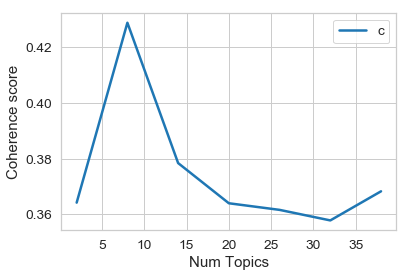

In [0]:
# Show graph
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [0]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 2  has Coherence Value of 0.3642
Num Topics = 8  has Coherence Value of 0.4289
Num Topics = 14  has Coherence Value of 0.3784
Num Topics = 20  has Coherence Value of 0.364
Num Topics = 26  has Coherence Value of 0.3616
Num Topics = 32  has Coherence Value of 0.3578
Num Topics = 38  has Coherence Value of 0.3683


#### Modelo LSI 

In [0]:
import seaborn as sns
from collections import OrderedDict
%pylab inline

Populating the interactive namespace from numpy and matplotlib


C:\Users\maria.gontijo\AppData\Local\Continuum\anaconda3\lib\site-packages\IPython\core\magics\pylab.py:160: UserWarning: pylab import has clobbered these variables: ['array', 'NaN', 'log', 'step']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [0]:
tfidf = models.TfidfModel(corpus2)
corpus_tfidf = tfidf[corpus2]


In [0]:
lsi = models.LsiModel(corpus_tfidf, id2word=dados_dict, num_topics=10)
corpus_lsi = lsi[corpus_tfidf]

In [0]:
data = {i: OrderedDict(lsi.show_topic(i,11)) for i in range(11)}

In [0]:
print(lsi.show_topic(0,4))
OrderedDict(lsi.show_topic(0,4))

[('aneel', 0.4980006570789798), ('transmissor', 0.3757741607559064), ('servico', 0.2664299506476997), ('transmissao', 0.15913695347306464)]


OrderedDict([('aneel', 0.4980006570789798),
             ('transmissor', 0.3757741607559064),
             ('servico', 0.2664299506476997),
             ('transmissao', 0.15913695347306464)])

In [0]:
df = pd.DataFrame(data)
print(df.shape)
df = df.fillna(0).T

(76, 11)


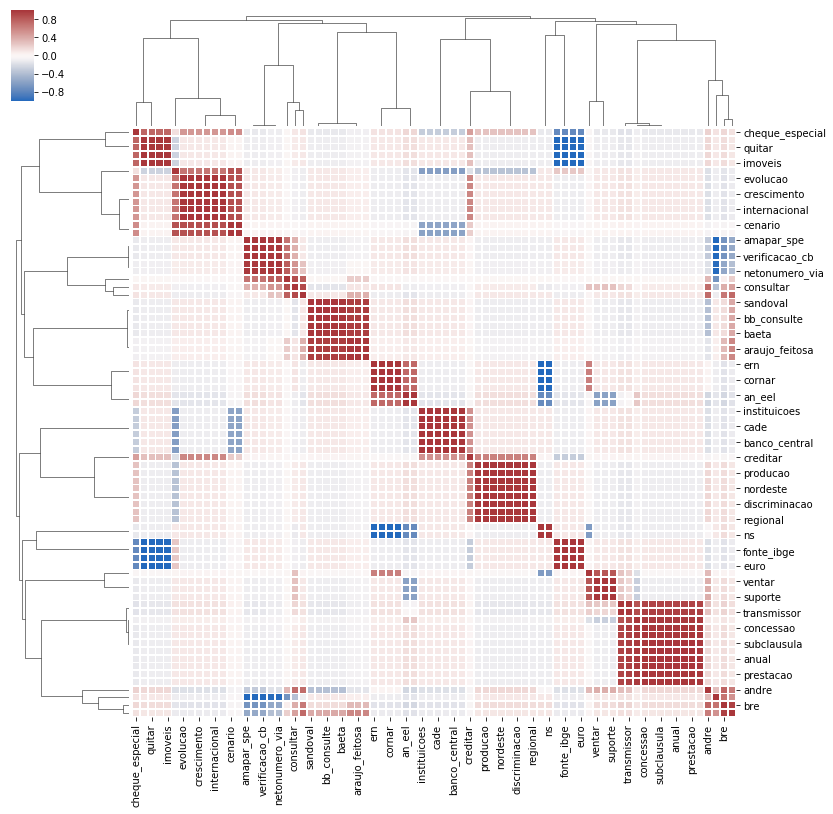

In [0]:
sns.clustermap(df.corr(), center=0, cmap="vlag", metric='cosine',
               linewidths=.75, figsize=(13, 13))

In [0]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model=lsi
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [0]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=dados_dict, corpus=corpus, texts=texts, start=2, limit=40, step=6)

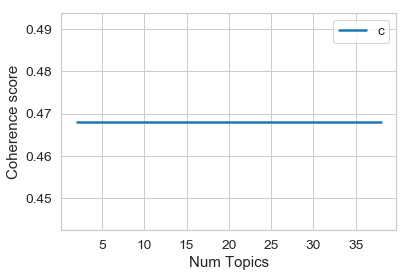

In [0]:
# Show graph
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [0]:
lsi.show_topics(11,4)

[(0,
  '0.498*"aneel" + 0.376*"transmissor" + 0.266*"servico" + 0.159*"transmissao"'),
 (1,
  '-0.382*"inflacao" + -0.234*"creditar" + -0.197*"cenario" + -0.188*"crescimento"'),
 (2,
  '-0.573*"consultar" + -0.515*"andre" + -0.336*"digitalmente" + -0.138*"silvanumero_via"'),
 (3,
  '0.466*"silvanumero_via" + 0.465*"luiz_tiburtino" + 0.464*"araujo_feitosa" + -0.310*"andre"'),
 (4,
  '0.273*"cheque_especial" + -0.170*"inflacao" + 0.131*"quitar" + -0.125*"fonte_ibge"'),
 (5,
  '-0.466*"corn" + 0.131*"infra_estrutura" + -0.124*"an_eel" + 0.120*"andre"'),
 (6, '-0.571*"corn" + -0.152*"an_eel" + -0.119*"andre" + -0.114*"consultar"'),
 (7,
  '0.249*"inflacao" + -0.210*"creditar" + -0.135*"instituicoes" + -0.133*"cade"'),
 (8,
  '0.224*"creditar" + -0.222*"inflacao" + 0.218*"nordeste" + 0.187*"producao"'),
 (9,
  '0.656*"netonumero_via" + 0.536*"ektt" + -0.278*"andre" + -0.250*"digitalmente"')]

In [0]:
for doc  in corpus_lsi:
    print(doc)

[(0, 0.8169576329882409), (1, -0.008705225956402057), (2, 0.14259492975997728), (3, 0.02286158539726016), (4, -0.030344060958253472), (5, 0.25294706973181197), (6, -0.15738011858151577), (7, 0.032700958657478754), (8, 0.00782675727827442), (9, 0.012030726404614916)]
[(0, 0.7484299487973745), (1, -0.00037569328190850345), (2, 0.12904679810957045), (3, 0.020196137064058303), (4, -0.02343250128310495), (5, 0.22753744237792733), (6, -0.13851145716856267), (7, 0.043203465870375345), (8, 0.01696848163232384), (9, 0.01362873988401642)]
[(0, 0.4292659751300461), (1, -0.01238936083501284), (2, 0.05856321208026798), (3, 0.002099855397131942), (4, -0.0275314753018868), (5, 0.04031722575805532), (6, -0.04407531699186339), (7, -0.007534230665730467), (8, 0.038363166666827674), (9, -0.008463153421746805)]
[(0, 0.38210965441952816), (1, 0.0019256724708855211), (2, 0.04565223288313835), (3, -0.009953440028981159), (4, 0.07117660708815304), (5, -0.49792813063478214), (6, -0.552420287746513), (7, 0.0194

[(0, 0.5913207735844636), (1, -0.020380187075328883), (2, 0.10730748150547381), (3, 0.0025414406351917814), (4, -0.018102976119085054), (5, 0.13182972048600497), (6, -0.11154368838573092), (7, -0.004500741277304055), (8, 0.023764949880424817), (9, 0.00011396212915546764)]
[(0, 0.29874384559128697), (1, -0.00412821390639291), (2, 0.007486973833242999), (3, -0.010304204660025781), (4, 0.00484869043443367), (5, -0.054709755275222184), (6, 0.07546143508014956), (7, -0.033153516152849165), (8, -0.006781335474206101), (9, -0.015278496044294609)]
[(0, 0.5635712160173049), (1, -0.004401812711009088), (2, 0.028096495696603274), (3, -0.0010551736342124301), (4, 0.0025915032806029564), (5, -0.06279609866962986), (6, 0.06535539716155989), (7, -0.01642178852800494), (8, -0.011204372495489752), (9, -0.018088536754211737)]
[(0, 0.3192376133280656), (1, 0.008656469147569948), (2, -0.20688056363547386), (3, -0.05244687768704583), (4, -0.0020471402900833465), (5, 0.007913820865121586), (6, -0.0086559846

[(0, 0.8592312191276781), (1, 0.015417678065980992), (2, 0.026537854742709706), (3, -0.006372986441597056), (4, 0.013760598450759425), (5, -0.10088159720390423), (6, 0.1208075009659295), (7, -0.007151637820519171), (8, -0.013601396063593967), (9, -0.016188310239748184)]
[(0, 0.41949615737382234), (1, 0.013851307030011287), (2, -0.43709648876380897), (3, -0.1014385596876796), (4, -0.009584650147434745), (5, 0.06351976125651324), (6, -0.06504352597742138), (7, 0.002023728898448596), (8, -0.011629043177715983), (9, -0.2819191972414335)]
[(0, 0.42381839281241934), (1, 0.0002823842319680635), (2, 0.06642858587858355), (3, 0.004825490226860131), (4, -0.008306688518154682), (5, 0.051729732664613774), (6, -0.04288381267425128), (7, 0.009846767600335107), (8, 0.006757079057685984), (9, -0.006570930627898913)]
[(0, 0.4885281169665235), (1, -0.001082761891378692), (2, 0.05658483969901281), (3, 0.0031036001416479015), (4, -0.004475320672612391), (5, 0.024093687391450944), (6, -0.01873302412459979)

[(0, 0.7523279087914698), (1, 0.004731940509356717), (2, 0.021151533445923694), (3, -0.006103077202490384), (4, 0.0075257986678837025), (5, -0.07909343609479183), (6, 0.10410801611229349), (7, -0.009702424080043666), (8, -0.009278134299507959), (9, -0.011550340794479603)]
[(0, 0.8153847840629005), (1, 0.014048712606302603), (2, 0.02533186440248965), (3, -0.004925169745261536), (4, 0.013088243949468581), (5, -0.08556177792384694), (6, 0.10617703381340374), (7, -0.003603495986781757), (8, -0.010819529484227241), (9, -0.010705562861165818)]
[(0, 0.7711314557341026), (1, 0.010575457442110789), (2, 0.01865833601417907), (3, -0.009584322669579733), (4, 0.008347382014070205), (5, -0.08697553334141944), (6, 0.11368632434869116), (7, -0.009234559746778469), (8, -0.006967874988375965), (9, -0.010482457491878348)]
[(0, 0.5359554603582347), (1, -0.014015855089381706), (2, 0.08272283809390284), (3, 0.015495821094403485), (4, -0.0219577679561817), (5, 0.12546985538896566), (6, -0.07790153838666768),

[(0, 0.019679390984338647), (1, -0.5063199805984868), (2, -0.01307123677685829), (3, -0.002113595208459757), (4, 0.26887728670928185), (5, 0.018143660061149793), (6, 0.006015221972479353), (7, -0.013127776433344843), (8, -0.008715625776947455), (9, 0.002418147577830194)]
[(0, 0.014714654557662887), (1, -0.40566057363419594), (2, -0.010243866827686413), (3, 0.00014380931002480182), (4, -0.28697711527431874), (5, -0.05553326615586801), (6, 0.019439142684463628), (7, 0.11020856056074525), (8, 0.06376337509934568), (9, -0.003996028900509368)]
[(0, 0.012794570750650783), (1, -0.1316079504062949), (2, 0.005465232752779893), (3, 0.0013597545248596246), (4, 0.02926873255735006), (5, 0.029354651587653185), (6, -0.02812240343617361), (7, -0.22173292484040782), (8, -0.012676082112044695), (9, -0.0024028889604396047)]
[(0, 0.02271915035498786), (1, -0.35480399589919287), (2, -0.004963253636248649), (3, 0.0005173139577676853), (4, -0.3553633302800785), (5, -0.05978689958683791), (6, 0.0065943713258

[(0, 0.017853002113886896), (1, -0.4384009451218453), (2, -0.005555956965662867), (3, 0.002959236348393129), (4, -0.25057196686286914), (5, -0.032047843288451915), (6, 0.001043472476741279), (7, 0.17094466322036053), (8, -0.20348828606766534), (9, 0.007185366924758498)]
[(0, 0.008682482150195122), (1, -0.02995312123855868), (2, 0.0005839888587013296), (3, -0.0006380995000824102), (4, -0.002530223011389217), (5, 0.001990870169111456), (6, -0.0024519274977937437), (7, -0.02630006971567747), (8, -0.039386669111919875), (9, -0.0011030670413774485)]
[(0, 0.012525535511008653), (1, -0.31474816876367845), (2, -0.005820724430354495), (3, -0.0012605582856702843), (4, 0.09642262682155961), (5, 0.01071084766800968), (6, 0.005640443531273718), (7, -0.03296070657111398), (8, 0.025490789622342285), (9, -0.002711914891958903)]
[(0, 0.0008118381040831909), (1, -0.010667077726829264), (2, 2.9158590657448727e-06), (3, 0.00026152042380712097), (4, -0.0026768758244776515), (5, -0.0020358149022602504), (6,

#### 2.Construa Uma matriz de similaridade entre os documentos do corpus a partir dos pesos

In [0]:
data = {'doc%s'%i: dict(doc) for i,doc in enumerate(corpus_lsi[:10])}
dfdoc = pd.DataFrame(data)
dfdoc = dfdoc.fillna(0)
dfdoc.head()

,doc0,doc1,doc2,doc3,doc4,doc5,doc6,doc7,doc8,doc9
0,0.017039,0.455216,0.284722,0.251088,0.276575,0.600514,0.000850,0.293981,0.431678,0.437214
1,0.000719,-0.000212,0.000991,0.001405,0.001190,0.003621,-0.000151,-0.000499,0.000100,0.000239
2,-0.002781,-0.203725,-0.101523,-0.020305,0.051959,0.087833,-0.005304,-0.140681,-0.105483,-0.103924
3,-0.002061,-0.007382,-0.008016,-0.003586,0.000596,-0.000174,0.000229,-0.004347,-0.013536,-0.006317
4,-0.001684,0.055909,-0.024531,-0.086193,-0.013446,-0.009911,0.003807,-0.013134,-0.031459,0.001001


In [0]:
index = similarities.MatrixSimilarity(corpus_lsi)

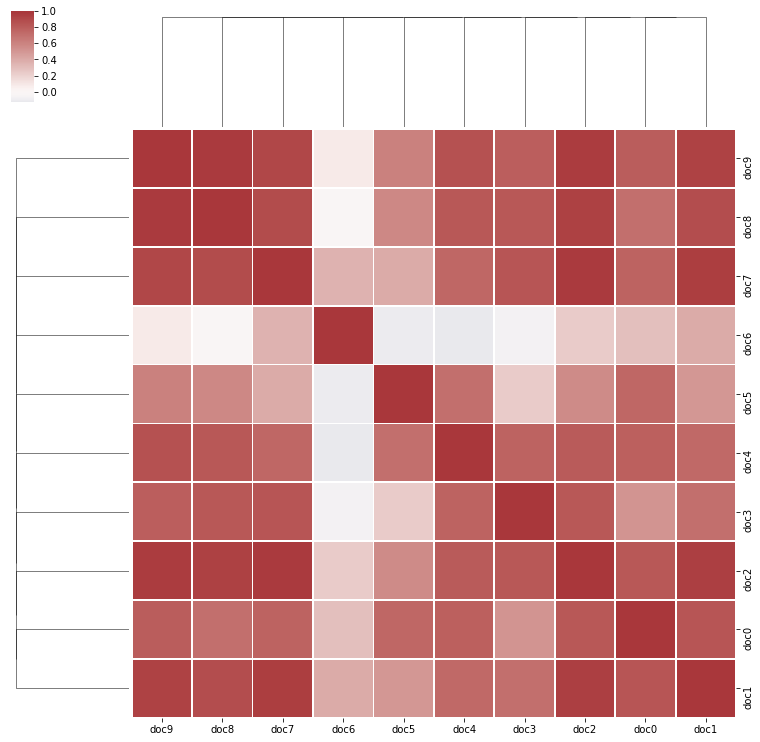

In [0]:
sns.clustermap(dfdoc.corr(), center=0, cmap="vlag", metric='hamming',
               linewidths=.75, figsize=(13, 13));

In [0]:
dfdoc.T.describe()

,0,1,2,3,4,5,6,7,8,9
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,0.304888,0.000740,-0.054393,-0.004459,-0.011964,-0.004942,0.022387,-0.026759,0.017065,-0.008088
std,0.189472,0.001197,0.091168,0.004465,0.035253,0.068574,0.059305,0.099055,0.119539,0.065894
min,0.000850,-0.000499,-0.203725,-0.013536,-0.086193,-0.100768,-0.077275,-0.136873,-0.288512,-0.177628
25%,0.257460,-0.000088,-0.105093,-0.007116,-0.021760,-0.035667,0.005506,-0.090464,0.003795,-0.009988
50%,0.289352,0.000479,-0.060914,-0.003967,-0.011523,-0.001205,0.021153,-0.034731,0.014206,-0.000289
75%,0.435830,0.001140,-0.003412,-0.000646,0.000330,0.001886,0.052194,-0.004231,0.088746,0.021837
max,0.600514,0.003621,0.087833,0.000596,0.055909,0.164972,0.121582,0.219574,0.142597,0.067821


In [0]:
corpus=pd.read_csv(r'documentos2.csv')
fonte = similarities.MatrixSimilarity(corpus_lsi)
fonte = list(fonte)
head = list(corpus.id)
fonte.insert(0,np.array(head))

ms = pd.DataFrame(fonte[1:],index=np.array(head),columns=np.array(head))
sample = ms.iloc[:10,:10]
sample

,001-2002.pdf,001-2005.pdf,001-2011.pdf,001-2014.pdf,001-2017.pdf,001-2019.pdf,002-2002.pdf,002-2005.pdf,002-2011.pdf,002-2013.pdf
001-2002.pdf,1.000000,0.999690,0.970445,0.374701,0.827279,0.386683,0.999055,0.999616,0.972855,0.930031
001-2005.pdf,0.999690,1.000000,0.971336,0.374975,0.830348,0.391550,0.998427,0.999738,0.973970,0.932330
001-2011.pdf,0.970445,0.971336,1.000000,0.456831,0.918615,0.400790,0.961004,0.968110,0.994995,0.980122
001-2014.pdf,0.374701,0.374975,0.456831,1.000000,0.412869,0.194388,0.363350,0.370481,0.436541,0.455523
001-2017.pdf,0.827279,0.830348,0.918615,0.412869,1.000000,0.432829,0.802586,0.819370,0.932114,0.973545
001-2019.pdf,0.386683,0.391550,0.400790,0.194388,0.432829,1.000000,0.374902,0.392018,0.405545,0.422630
002-2002.pdf,0.999055,0.998427,0.961004,0.363350,0.802586,0.374902,1.000000,0.999218,0.962207,0.913442
002-2005.pdf,0.999616,0.999738,0.968110,0.370481,0.819370,0.392018,0.999218,1.000000,0.969494,0.924975
002-2011.pdf,0.972855,0.973970,0.994995,0.436541,0.932114,0.405545,0.962207,0.969494,1.000000,0.989345
002-2013.pdf,0.930031,0.932330,0.980122,0.455523,0.973545,0.422630,0.913442,0.924975,0.989345,1.000000


In [0]:
sample.to_csv('similaridade.csv',sep=';', encoding='utf-8-sig')

In [0]:
sims = index[doc]
#pprint(list(enumerate(sims)))
pprint(sorted(list(enumerate(sims)), key=lambda x:x[1], reverse=True))

[(306, 0.9999999),
 (293, 0.92915356),
 (222, 0.91175365),
 (224, 0.89318764),
 (202, 0.84697336),
 (260, 0.84399027),
 (295, 0.8352588),
 (226, 0.8028161),
 (285, 0.7676561),
 (272, 0.749172),
 (247, 0.7287089),
 (231, 0.7283212),
 (268, 0.7241727),
 (269, 0.722492),
 (214, 0.71068364),
 (267, 0.69423103),
 (256, 0.6927346),
 (255, 0.68049216),
 (207, 0.67509496),
 (284, 0.6712128),
 (225, 0.664613),
 (232, 0.664613),
 (297, 0.664613),
 (241, 0.6448412),
 (296, 0.61984444),
 (281, 0.619357),
 (280, 0.6181197),
 (246, 0.6132044),
 (240, 0.59895104),
 (288, 0.58957195),
 (276, 0.5619214),
 (171, 0.56083924),
 (196, 0.5600297),
 (173, 0.5585745),
 (286, 0.5528511),
 (189, 0.5528487),
 (263, 0.5305903),
 (303, 0.52875155),
 (190, 0.52487165),
 (185, 0.5231741),
 (228, 0.5231298),
 (301, 0.52307385),
 (194, 0.52159),
 (305, 0.51729745),
 (223, 0.512774),
 (239, 0.5101823),
 (227, 0.50220263),
 (274, 0.48758474),
 (168, 0.48548892),
 (287, 0.47075573),
 (186, 0.45282573),
 (243, 0.4417679),

In [0]:
from nltk.tokenize import WordPunctTokenizer
from nltk.corpus import stopwords
import string

from collections import defaultdict
from nltk.stem.snowball import PortugueseStemmer
import nltk
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [0]:
textos=docs
tok_textos = [WordPunctTokenizer().tokenize(t.lower()) for t in textos]
len(set(tok_textos[0]))

1903

In [0]:
vocab = set([])
for t in tok_textos:
    vocab = vocab.union(set(t))
vocab = map(lambda x:x.lower(),vocab)
vocab = list(set(vocab))
vocab[:6]

['eierict',
 'írahria',
 'zarzurassinado',
 'jsões',
 'cclril',
 'fariadiretorgliender']

In [0]:
T = nltk.TextCollection(tok_textos)

In [0]:
print(str(len(tok_textos)) + ' textos na coleção')
print(str(len(vocab)) + ' palavras únicas na coleção')

307 textos na coleção
62231 palavras únicas na coleção


#### Similaridade por cosseno

In [0]:
q = "Transmissora de energia"
qt = WordPunctTokenizer().tokenize(q.lower())

In [0]:
binary_matrix = np.zeros((len(tok_textos),len(qt)))
# Frequência no texto
tf_matrix = np.zeros((len(tok_textos),len(qt)))
# Frequência por tf_idf
tfidf_matrix = np.zeros((len(tok_textos),len(qt)))

for j, termo in enumerate(qt):
    for i, texto in enumerate(tok_textos):
        tfidf_matrix[i,j] = T.tf_idf(termo,texto)
        tf_matrix[i,j] = T.tf(termo,texto)
        if tf_matrix[i,j] > 0:
            binary_matrix[i,j] = 1

In [0]:
def ordem(q,MN):
    return [np.dot(q,r) for r in MN]

In [0]:
from numpy.linalg import norm

# Matrizes normalizadas
Mbin_Norm = np.array([r/norm(r) if norm(r) !=0 else np.zeros(len(r)) for r in binary_matrix])
Mtf_Norm = np.array([r/norm(r) if norm(r) !=0 else np.zeros(len(r)) for r in tf_matrix])
Mtfidf_Norm = np.array([r/norm(r) if norm(r) !=0 else np.zeros(len(r)) for r in tfidf_matrix])

In [0]:
# Construção dos vetores ordenados
vetor_tfidf = np.array([T.tf_idf(w,qt) for w in qt])
vetor_tfidf /= norm(vetor_tfidf)
resp_tfidf = ordem(vetor_tfidf,Mtfidf_Norm)

vetor_tf = np.array([T.tf(w,qt) for w in qt])
vetor_tf /= norm(vetor_tf)
resp_tf = ordem(vetor_tf,Mtf_Norm)

vetor_bin = np.ones(len(qt))
vetor_bin /= norm(vetor_bin)
resp_bin = ordem(vetor_bin,Mbin_Norm)

In [0]:
vbin = filter(lambda x : x[0]!=0.0, zip(resp_bin,range(len(tok_textos))))
vtf = filter(lambda x : x[0]!=0.0, zip(resp_tf,range(len(tok_textos))))
vtfidf = filter(lambda x : x[0]!=0.0, zip(resp_tfidf,range(len(tok_textos))))

In [0]:
# Resposta ordenada
resposta_bin = sorted(vbin, reverse=True)
resposta_tf = sorted(vtf, reverse=True)
resposta_tfidf = sorted(vtfidf, reverse=True)

In [0]:
print(binary_matrix.shape)
binary_matrix[:3,:]

(307, 3)


array([[1., 1., 1.],
       [1., 1., 1.],
       [1., 1., 1.]])

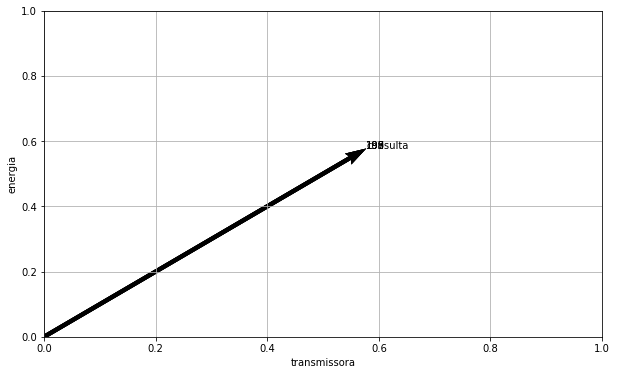

In [0]:
fig = plt.figure(figsize=(10,6))
ax = plt.gca()
docs = 3
vecs = [vetor_bin[:2]]
for d in resposta_bin[:docs]:
    vecs.append(Mbin_Norm[d[1]][:2])
    x,y = Mbin_Norm[d[1]][:2]
    plt.text(x,y,'{}'.format(d[1]))
U, V = zip(*vecs)
x,y = zeros(docs+1), zeros(docs+1)
plt.text(U[0],V[0],'consulta')
plt.grid()
ax.set_xlim(0,1)
ax.set_ylim(0,1)
ax.set_xlabel('transmissora')
ax.set_ylabel('energia')
ax.quiver(x,y,U,V,angles='xy',scale_units='xy', scale=1.0);

In [0]:
print(tf_matrix.shape)
tf_matrix[:3,:]

(307, 3)


array([[0.00904549, 0.06771192, 0.00189524],
       [0.01030323, 0.06441615, 0.00376948],
       [0.0048609 , 0.04392043, 0.00265453]])

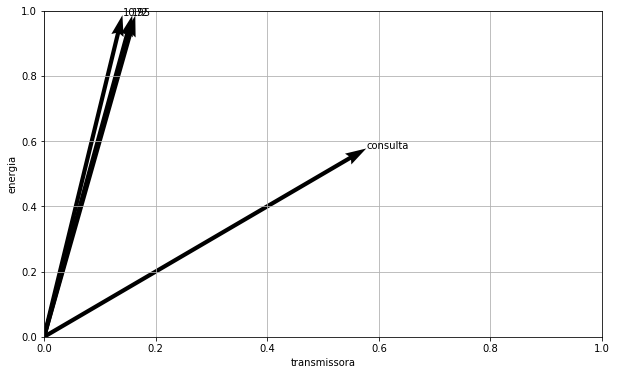

In [0]:
fig = plt.figure(figsize=(10,6))
ax = plt.gca()
docs = 3
vecs = [vetor_tf[:2]]
for d in resposta_tf[:docs]:
    vecs.append(Mtf_Norm[d[1]][:2])
    x,y = Mtf_Norm[d[1]][:2]
    plt.text(x,y,'{}'.format(d[1]))
U, V = zip(*vecs)
x,y = zeros(docs+1), zeros(docs+1)
plt.text(U[0],V[0],'consulta')
plt.grid()
ax.set_xlim(0,1)
ax.set_ylim(0,1)
ax.set_xlabel('transmissora')
ax.set_ylabel('energia')
ax.quiver(x,y,U,V,angles='xy',scale_units='xy', scale=1.0);

#### Vetorização por TF-IDF

In [0]:
print(tfidf_matrix.shape)
tfidf_matrix[:3,:]

(307, 3)


array([[0.00401298, 0.00111188, 0.0007197 ],
       [0.00457097, 0.00105776, 0.00143142],
       [0.00215651, 0.00072121, 0.00100803]])

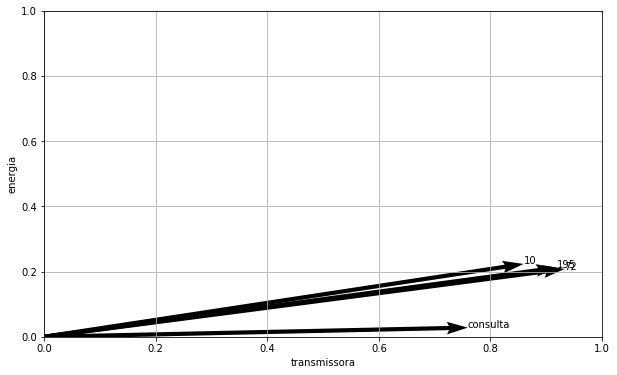

In [0]:
fig = plt.figure(figsize=(10,6))
ax = plt.gca()
docs = 3
vecs = [vetor_tfidf[:2]]
for d in resposta_tf[:docs]:
    vecs.append(Mtfidf_Norm[d[1]][:2])
    x,y = Mtfidf_Norm[d[1]][:2]
    plt.text(x,y,'{}'.format(d[1]))
U, V = zip(*vecs)
x,y = zeros(docs+1), zeros(docs+1)
plt.text(U[0],V[0],'consulta')
plt.grid()
ax.set_xlim(0,1)
ax.set_ylim(0,1)
ax.set_xlabel('transmissora')
ax.set_ylabel('energia')
ax.quiver(x,y,U,V,angles='xy',scale_units='xy', scale=1.0);

#### Construindo a matriz de similaridade... 

In [0]:
x=10
print('Vetorização Binária')
print(resposta_bin[:x])
print('\n')
print('Vetorização por Frequência')
print(resposta_tf[:x])
print('\n')
print('Vetorização por TF-IDF')
print(resposta_tfidf[:x])

Vetorização Binária
[(1.0000000000000002, 199), (1.0000000000000002, 198), (1.0000000000000002, 197), (1.0000000000000002, 196), (1.0000000000000002, 195), (1.0000000000000002, 194), (1.0000000000000002, 193), (1.0000000000000002, 192), (1.0000000000000002, 191), (1.0000000000000002, 190)]


Vetorização por Frequência
[(0.7011168445345374, 10), (0.6984740573022264, 195), (0.6976317355725596, 72), (0.6952898402992245, 7), (0.6952658060470249, 47), (0.6949657054491643, 13), (0.6944870915889889, 155), (0.6937833500526526, 45), (0.6934949764348276, 1), (0.6931539228053075, 53)]


Vetorização por TF-IDF
[(0.9578263780932681, 10), (0.9575342585859885, 65), (0.9503224444763101, 155), (0.9497607352763164, 8), (0.9493806859624745, 124), (0.9430282353081882, 45), (0.941173517779079, 18), (0.9400863119518699, 36), (0.9399094198194267, 53), (0.9380744039243928, 46)]


#### Matriz de similaridade

In [0]:
vetor = TfidfVectorizer(min_df=1)
tfidf = vetor.fit_transform(textos)
matriz = (tfidf * tfidf.T).A
print (matriz)

[[1.         0.95268065 0.72161889 ... 0.00711461 0.28951271 0.40774431]
 [0.95268065 1.         0.73674938 ... 0.00821023 0.29292976 0.41920039]
 [0.72161889 0.73674938 1.         ... 0.00854903 0.28101883 0.33265938]
 ...
 [0.00711461 0.00821023 0.00854903 ... 1.         0.00854324 0.00644917]
 [0.28951271 0.29292976 0.28101883 ... 0.00854324 1.         0.15688054]
 [0.40774431 0.41920039 0.33265938 ... 0.00644917 0.15688054 1.        ]]


Text(0, 0.5, 'Frequência')

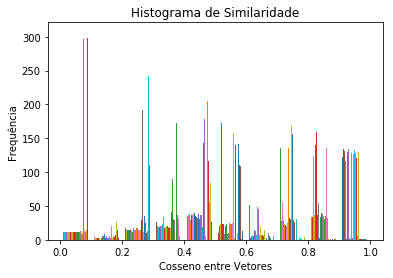

In [0]:
plt.hist(matriz)          
plt.title("Histograma de Similaridade")
plt.xlabel("Cosseno entre Vetores")
plt.ylabel("Frequência")

In [0]:
textos=corpus.content

In [0]:
tok_textos = [WordPunctTokenizer().tokenize(t.lower()) for t in textos]

In [0]:
len(set(tok_textos[0]))

17

In [0]:
vocab = set([])
for t in tok_textos:
    vocab = vocab.union(set(t))
#vocab = list(set(vocab))
print(len(vocab))
#vocab

5180


In [0]:
T = nltk.TextCollection(tok_textos)

In [0]:
T.idf("energia")

0.44364401884920857

In [0]:
T.idf("inflação")

3.018797546484987

In [0]:
T.tf_idf("energia",tok_textos[2])

0.005631588391597852

In [0]:
T.tf_idf("inflação",tok_textos[2])

0.0

In [0]:
T.tf("energia",tok_textos[2])

0.012693935119887164

In [0]:
q = "encargos da transmissora"
qt = WordPunctTokenizer().tokenize(q.lower())

In [0]:
tfidf_matrix = np.empty((len(tok_textos),len(qt)))
for j,w in enumerate(qt):
    for i, d in enumerate(tok_textos):
        tfidf_matrix[i,j] = T.tf_idf(w,d)
print(tfidf_matrix.shape)
tfidf_matrix[:3,:]

(307, 3)


array([[0.        , 0.        , 0.02360663],
       [0.        , 0.00299512, 0.00237575],
       [0.        , 0.00687569, 0.00279684]])

In [0]:
from numpy.linalg import norm
MN = np.array([r/norm(r) if norm(r) !=0 else np.zeros(len(r)) for r in tfidf_matrix])
def ordem(q):
    return [np.dot(q,r) for r in MN]
# calculando o tf-idf dos termos na consulta, considerando q um documento da Coleção...
# O que equivale a vetorizar a consulta.
qv = np.array([T.tf_idf(w,qt) for w in qt])
qv /= norm(qv)
r = ordem(qv)
v=filter(lambda x : x[0]!=0.0, zip(r,range(len(tok_textos))))

resposta = sorted(v, reverse=True) 
resposta

[(0.9578263780932681, 10),
 (0.9575342585859885, 65),
 (0.9503224444763101, 155),
 (0.9497607352763164, 8),
 (0.9493806859624745, 124),
 (0.9430282353081882, 45),
 (0.941173517779079, 18),
 (0.9400863119518699, 36),
 (0.9399094198194267, 53),
 (0.9380744039243928, 46),
 (0.9379694709202299, 101),
 (0.9371878588143437, 148),
 (0.9368546948234833, 96),
 (0.9364702744316195, 43),
 (0.9363015149297691, 47),
 (0.9350228242432481, 90),
 (0.9349386849747205, 158),
 (0.9341396417997907, 67),
 (0.9336566617732659, 74),
 (0.9335201650057507, 117),
 (0.933236430792064, 107),
 (0.9329164744293272, 94),
 (0.9327638161271621, 99),
 (0.9310712342611949, 63),
 (0.9308638712010576, 141),
 (0.930313122260325, 129),
 (0.9299796035180363, 2),
 (0.92890013053658, 44),
 (0.9278392233912798, 114),
 (0.9278137505705749, 68),
 (0.9277938351065523, 12),
 (0.9271040267627446, 88),
 (0.9270311649276042, 142),
 (0.9269122336574603, 119),
 (0.9256666845704034, 91),
 (0.925443848106285, 131),
 (0.9245099789598348, 1

In [0]:
t185 = nltk.Text(WordPunctTokenizer().tokenize(textos[200].lower()))
t185.concordance('energia')

no matches


In [0]:
t185.concordance('inflação')

Displaying 8 of 8 matches:
. 3 últimos 10 anos taxa de câmbio inflação x selic ibovespa ) $ r / $ s u ( .
fios e muitas oportunidades ... 18 inflação e taxa de juros 12 10 8 6 4 2 0 de
 90 dez / 19 3 , 41 expectativa de inflação para 2021 meta 2020 meta 2021 expe
meta 2020 meta 2021 expectativa de inflação para 2022 meta 2021 meta 2022 8 1 
s ocorrido expectativas de mercado inflação ancorada em torno da meta taxa sel
t 18 fev 19 jun 19 set 19 5 , 5 19 inflação e taxa de juros curva de juros – d
6 , 17 5 , 65 4 , 42 5 , 24 6 , 35 inflação ( ipca acum . 12m ) desemprego ( p
** 4 , 0 % a . a . 6 , 5 % a . a . inflação ** inadimplência ** spread bancári


In [0]:
for sim,tid in resposta: 
    fd=nltk.FreqDist(WordPunctTokenizer().tokenize(textos[tid].lower()))
    print("Ocorrências dos termos de busca no texto {}: ".format(tid),fd['energia'],fd['inflação'])

Ocorrências dos termos de busca no texto 10:  80 0
Ocorrências dos termos de busca no texto 65:  68 0
Ocorrências dos termos de busca no texto 155:  86 0
Ocorrências dos termos de busca no texto 8:  67 0
Ocorrências dos termos de busca no texto 124:  90 0
Ocorrências dos termos de busca no texto 45:  74 0
Ocorrências dos termos de busca no texto 18:  71 0
Ocorrências dos termos de busca no texto 36:  69 0
Ocorrências dos termos de busca no texto 53:  67 0
Ocorrências dos termos de busca no texto 46:  68 0
Ocorrências dos termos de busca no texto 101:  60 0
Ocorrências dos termos de busca no texto 148:  72 0
Ocorrências dos termos de busca no texto 96:  66 0
Ocorrências dos termos de busca no texto 43:  66 0
Ocorrências dos termos de busca no texto 47:  74 0
Ocorrências dos termos de busca no texto 90:  63 0
Ocorrências dos termos de busca no texto 158:  73 0
Ocorrências dos termos de busca no texto 67:  64 0
Ocorrências dos termos de busca no texto 74:  63 0
Ocorrências dos termos de b

Ocorrências dos termos de busca no texto 139:  26 0
Ocorrências dos termos de busca no texto 186:  20 0
Ocorrências dos termos de busca no texto 165:  26 0
Ocorrências dos termos de busca no texto 39:  27 0
Ocorrências dos termos de busca no texto 183:  27 0
Ocorrências dos termos de busca no texto 190:  19 0
Ocorrências dos termos de busca no texto 24:  24 0
Ocorrências dos termos de busca no texto 167:  26 0
Ocorrências dos termos de busca no texto 0:  22 0
Ocorrências dos termos de busca no texto 33:  31 0
Ocorrências dos termos de busca no texto 133:  30 0
Ocorrências dos termos de busca no texto 79:  23 0
Ocorrências dos termos de busca no texto 77:  31 0
Ocorrências dos termos de busca no texto 146:  32 0
Ocorrências dos termos de busca no texto 84:  22 0
Ocorrências dos termos de busca no texto 127:  28 0
Ocorrências dos termos de busca no texto 144:  30 0
Ocorrências dos termos de busca no texto 89:  23 0
Ocorrências dos termos de busca no texto 50:  27 0
Ocorrências dos termos